In [1]:
import os
import sys
import cv2
import warnings
import numpy as np
import pandas as pd
import plotly.express as px
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
from tqdm.auto import tqdm
#self import
sys.path.insert(0, '../')
from conf import DSAMPLE_SUBMISSION, TRAIN_CSV, TRAIN_PATH, TEST_PATH, TRAIN_SEMI_SUPERVISED_PATH
from conf import df_train, train_images_path, test_images_path, train_semi_supervised_path


warnings.simplefilter('ignore')
tqdm.pandas() 

/usr/lib/python3.10/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
100%|███████████████████████████████████████████████████████████████████████████████████████████| 1972/1972 [00:00<00:00, 357950.73it/s]


<h2><center>Распределительные участки</center></h2>

In [2]:
def plot_distribution(x):

    fig = px.histogram(
    df_train, 
    x = x,
    width = 800,
    height = 500,
    )
    
    fig.show()

## **Распределение типов клеток**

In [3]:
plot_distribution('cell_type')

## **Распределение пластин во времени**

In [4]:
plot_distribution('plate_time')

## **Дельта рапределения прошедшего времени**

In [5]:
plot_distribution('elapsed_timedelta')

## **Набор тренировочных изображений**

<h2><center>Просмотр изображения</center></h2>

In [6]:
def display_multiple_img(images_paths, rows, cols):
    """
     Функция для отображения изображений из набора данных.
    
     параметры: images_path(string) - Пути изображений для отображения
                 rows(int) - количество строк в выводе
                 cols(int) - количество столбцов в выводе
    """
    figure, ax = plt.subplots(nrows=rows,ncols=cols,figsize=(16,8) )
    for ind,image_path in enumerate(images_paths):
        image=cv2.imread(image_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB) 
        try:
            ax.ravel()[ind].imshow(image)
            ax.ravel()[ind].set_axis_off()
        except:
            continue;
    plt.tight_layout()
    plt.show()

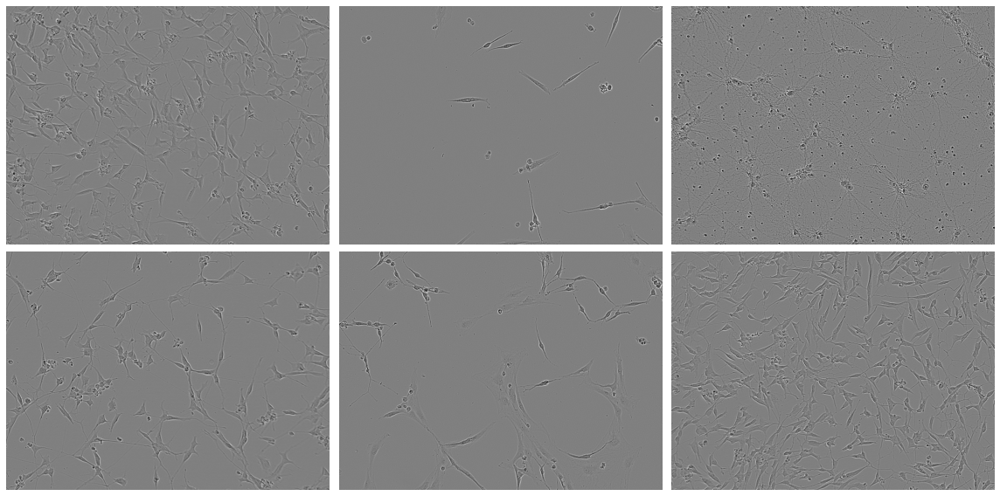

In [7]:
display_multiple_img(train_images_path[150:200], 2, 3)

## **Обучение полуконтролируемым изображениям**

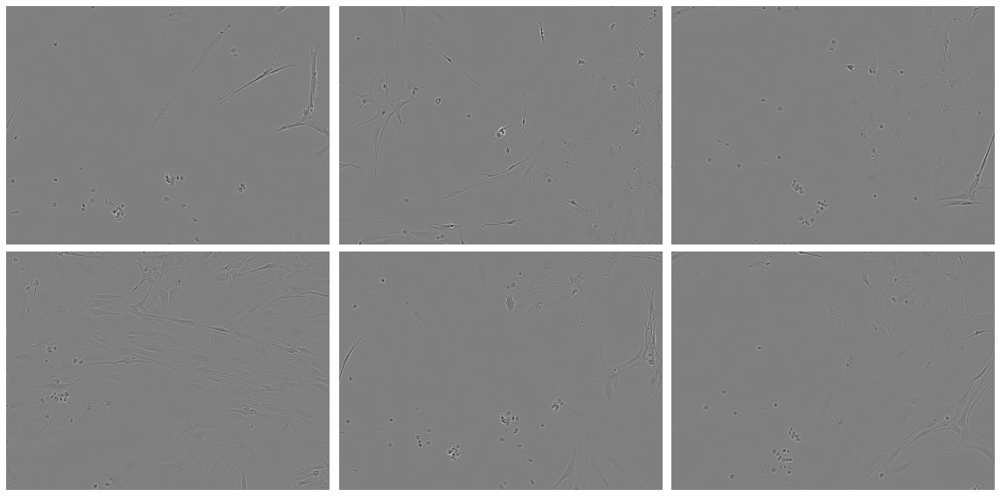

In [8]:
display_multiple_img(train_semi_supervised_path[150:200], 2, 3)

## **Примеры тренировочных изображений**

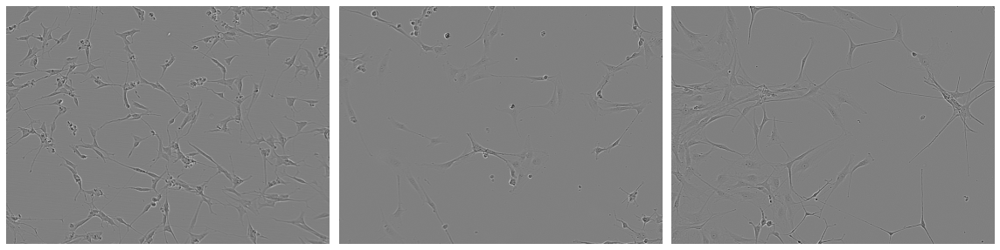

In [9]:
display_multiple_img(test_images_path, 1, 3)

## **Участки масок**

In [14]:
def rle_decode(mask_rle, shape, color=1):
    '''
    mask_rle: длина прогона в виде строки (начальная длина)
    shape: (высота, ширина, каналы) возвращаемого массива
    color: цвет для маски
    Returns Масив numpy (3-х мерная маска)
    '''
    s = mask_rle.split()
    
    starts = list(map(lambda x: int(x) - 1, s[0::2]))
    lengths = list(map(int, s[1::2]))
    ends = [x + y for x, y in zip(starts, lengths)]
    
    img = np.zeros((shape[0] * shape[1], shape[2]), dtype=np.float32)
            
    for start, end in zip(starts, ends):
        img[start : end] = color
        
    return img.reshape(shape)


def plot_masks(image_id, colors:bool): 
    labels = df_train[df_train["id"] == image_id]["annotation"].tolist()
    cell_type = df_train[df_train["id"] == image_id]["cell_type"].tolist()
    cmap = {"shsy5y":(0,0,255),"astro":(0,255,0),"cort":(255,0,0)}

    if colors:
        mask = np.zeros((520, 704, 3))
        for label,cell_type in zip(labels,cell_type):
            c = cmap[cell_type]
            mask += rle_decode(label, shape=(520, 704, 3), color=c)
    else:
        mask = np.zeros((520, 704,3))
        for label in labels:
            mask += rle_decode(label, shape=(520, 704,3))
    mask = mask.clip(0, 1)

    image = cv2.imread(f"{TRAIN_PATH}/{image_id}.png")
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    plt.figure(figsize=(16, 32))
    plt.subplot(3, 1, 1)
    plt.imshow(image)
    plt.axis("off")
    plt.subplot(3, 1, 2)
    plt.imshow(image)
    plt.imshow(mask, alpha=0.5)
    plt.axis("off")
    plt.subplot(3, 1, 3)
    plt.imshow(mask)
    plt.axis("off")
    
    plt.show();

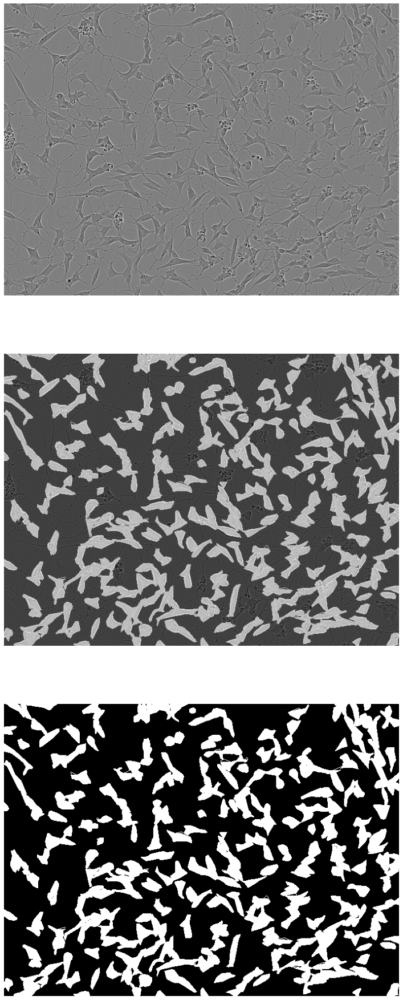

In [15]:
plot_masks("0030fd0e6378", colors=False)

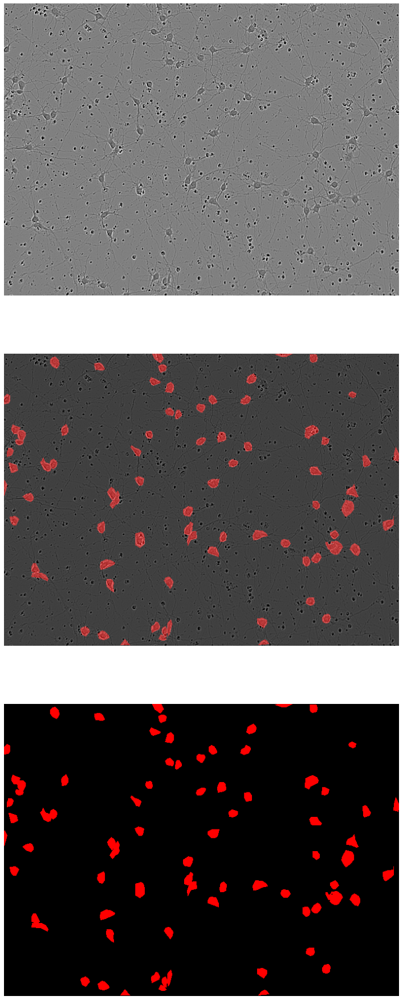

In [16]:
plot_masks("ffdb3cc02eef",colors=True)

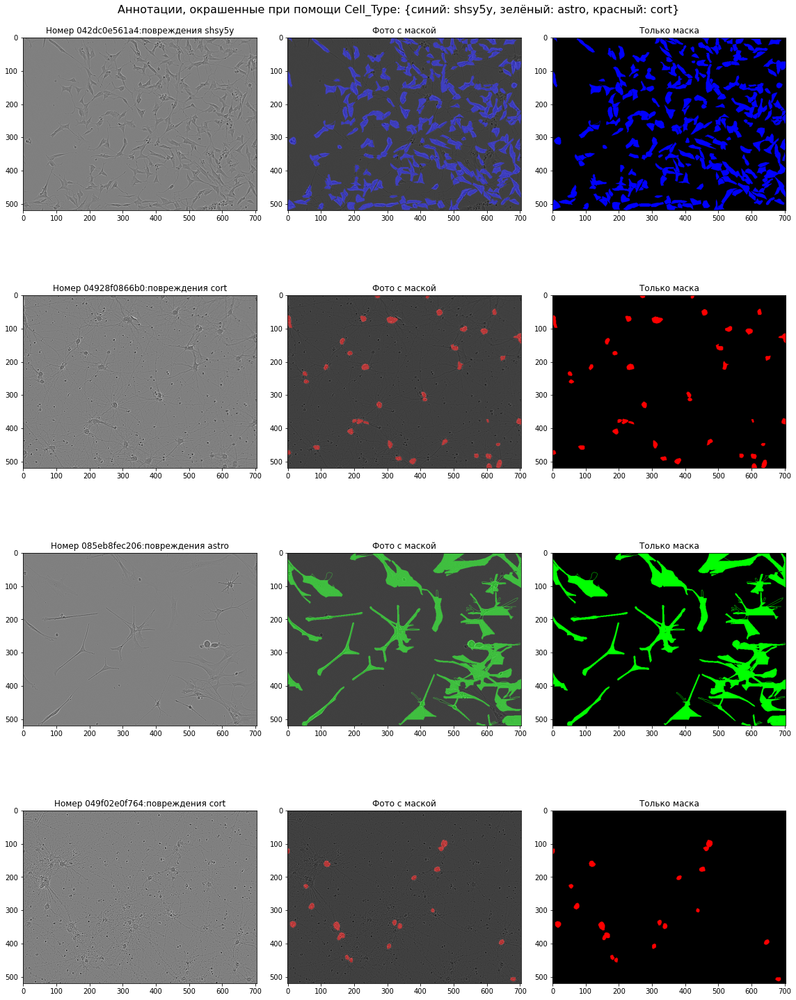

In [18]:
def plot_masks_all(image_ids, colors=True):
    fig, ax = plt.subplots(len(image_ids),3,figsize=(16, 21))
    for idx,image_id in enumerate(image_ids):
        labels = df_train[df_train["id"] == image_id]["annotation"].tolist()
        cell_type = df_train[df_train["id"] == image_id]["cell_type"].tolist()
        cmap = {"shsy5y":(0,0,255),"astro":(0,255,0),"cort":(255,0,0)}

        if colors:
            mask = np.zeros((520, 704, 3))
            for label,cell_t in zip(labels,cell_type):
                c = cmap[cell_t]
                mask += rle_decode(label, shape=(520, 704, 3), color=c)
        else:
            mask = np.zeros((520, 704, 1))
            for label in labels:
                mask += rle_decode(label, shape=(520, 704, 1))
        mask = mask.clip(0, 1)

        image = cv2.imread(f"{TRAIN_PATH}/{image_id}.png")
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        ax[idx,0].imshow(image)
        ax[idx,0].set_title(f"Номер {image_id}:повреждения {cell_t}")
        plt.axis(True)
        
        ax[idx,1].imshow(image)
        ax[idx,1].imshow(mask, alpha=0.5)
        ax[idx,1].set_title(f"Фото с маской")
        plt.axis(True)
        
        ax[idx,2].imshow(mask)
        ax[idx,2].set_title(f"Только маска")
        plt.axis(True)
    plt.tight_layout()
    fig.suptitle("Аннотации, окрашенные при помощи Cell_Type: {синий: shsy5y, зелёный: astro, красный: cort}",fontsize=16)
    plt.show();

plot_masks_all(['042dc0e561a4', '04928f0866b0',  '085eb8fec206','049f02e0f764'])

<h2><center>Исследование изображений</center></h2>

## **Размеры и 2D-гистограмма**

Просто посмотрите на размеры изображения, убедитесь, что оно 3-х полосное (RGB), масштабированное по байтам (0-255).

In [19]:
first = cv2.imread(train_images_path[0])
dims = np.shape(first)
print(dims)

(520, 704, 3)


Для любой конкретной классификации изображений, кластеризации и т. д. преобразования нам потребуется свернуть пространственные измерения, чтобы у нас была матрица пикселей по цветовым каналам.

In [20]:
pixel_matrix = np.reshape(first, (dims[0] * dims[1], dims[2]))
print(np.shape(pixel_matrix))

(366080, 3)


Диаграммы рассеяния используются для поиска кластеров и разделимости данных, но они заняты и плохо показывают плотность, поэтому вместо этого мы переключаемся на использование двумерных гистограмм. Данные между полосами действительно коррелированы, что типично для видимых изображений, и поэтому большинство аналитиков спутниковых изображений предпочитают, по крайней мере, иметь значения в ближнем инфракрасном диапазоне.

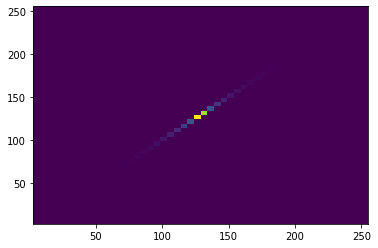

In [21]:
_ = plt.hist2d(pixel_matrix[:,1], pixel_matrix[:,2], bins=(50,50))

In [22]:
fifth = cv2.imread(train_images_path[4])
dims = np.shape(fifth)
pixel_matrix5 = np.reshape(fifth, (dims[0] * dims[1], dims[2]))

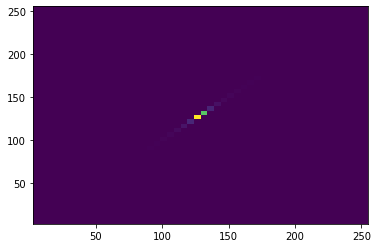

In [23]:
_ = plt.hist2d(pixel_matrix5[:,1], pixel_matrix5[:,2], bins=(50,50))

<h2><center>Промежуточное исследование изображений</center></h2>

## **Кластеризация K-средних**

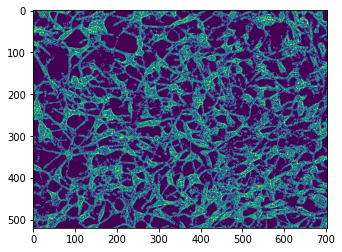

In [24]:
# простой k означает кластеризацию
from sklearn import cluster

kmeans = cluster.KMeans(5)
clustered = kmeans.fit_predict(pixel_matrix)

dims = np.shape(first)
clustered_img = np.reshape(clustered, (dims[0], dims[1]))
plt.imshow(clustered_img)
plt.show()

In [ ]:
# быстрый взгляд на гистограммы значений цвета для пиксельной матрицы из первого изображения
sns.distplot(pixel_matrix[:,0], bins=12)
sns.distplot(pixel_matrix[:,1], bins=12)
sns.distplot(pixel_matrix[:,2], bins=12)

<h2><center>Подробное исследование изображений</center></h2>

## **Элементарные преобразования, обнаружение краев, текстур**

In [39]:
set144 = [plt.imread(train_images_path[n]) for n in (100, 200)]
set145 = [cv2.cvtColor(set144[n], cv2.COLOR_BGR2RGB) for n in range(len(set144))]

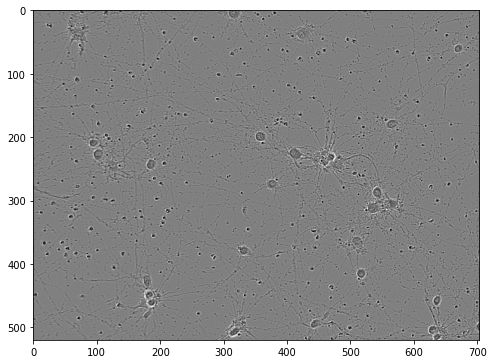

In [40]:
plt.figure(figsize=(8,10))
plt.imshow(set145[0])

## **Обнаружение краёв Собеля**

Фильтр Собеля — это одно из средств получения базовой величины/градиента изображения края. Может быть полезно для порога и поиска заметных линейных особенностей и т. д. Несколько других подобных фильтров в skimage.filters также являются хорошими детекторами границ: roberts, scharr и т. д., и вы можете управлять направлением, т. е. использовать анизотропную версию.

In [41]:
import skimage
from skimage.feature import greycomatrix, greycoprops
from skimage.filters import sobel

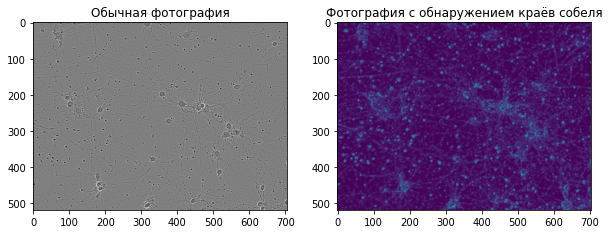

In [42]:
# фильтр Собеля - это основной способ получить изображение с величиной/градиентом края
from plotly.subplots import make_subplots

fig = plt.figure(figsize=(10,15))
ax1 = fig.add_subplot(2,2,1)
ax1.set_title(f'Обычная фотография')
ax1.imshow(set145[0][:520,:704])
ax2 = fig.add_subplot(2,2,2)
ax2.set_title(f'Фотография с обнаружением краёв собеля')
ax2.imshow(sobel(set144[0][:520,:704]))

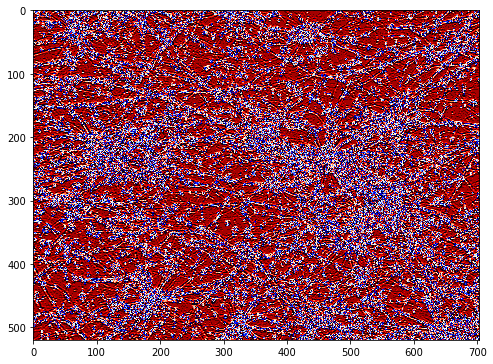

In [43]:
from skimage.filters import sobel_h

fig = plt.figure(figsize=(8, 8))
plt.imshow(sobel_h(set144[0]), cmap='flag')